In [ ]:
import tensorflow
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

In [ ]:
import numpy as np
import cv2
from numpy import mean
from numpy import std
from matplotlib import pyplot as plt
from sklearn.model_selection import KFold
from tensorflow.keras.datasets import mnist
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Flatten
from tensorflow.keras.optimizers import SGD

In [ ]:
x = np.load('img.npy')
y = np.load('qual.npy')
y = y-1
y = to_categorical(y)

In [ ]:
x_tr = np.load('Xc_train.npy')
x_te = np.load('Xc_test.npy')
x_va = np.load('Xc_val.npy')
y_tr = np.load('yc_train.npy')
y_te = np.load('yc_test.npy')
y_va = np.load('yc_val.npy')

In [ ]:
y_tr = to_categorical(y_tr)
y_te = to_categorical(y_te)
y_va = to_categorical(y_va)

In [ ]:
model = Sequential()
model.add(Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_uniform', input_shape=(64, 64, 3)))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform'))
model.add(MaxPooling2D((2, 2)))
model.add(Flatten())
model.add(Dense(50, activation='relu', kernel_initializer='he_uniform'))
model.add(Dense(2, activation='softmax'))
# compile model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 62, 62, 16)        448       
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 31, 31, 16)       0         
 g2D)                                                            
                                                                 
 conv2d_11 (Conv2D)          (None, 29, 29, 32)        4640      
                                                                 
 max_pooling2d_11 (MaxPoolin  (None, 14, 14, 32)       0         
 g2D)                                                            
                                                                 
 flatten_5 (Flatten)         (None, 6272)              0         
                                                                 
 dense_10 (Dense)            (None, 50)               

In [ ]:
history = model.fit(x_tr, y_tr, epochs=5, batch_size=4, validation_data=(x_va, y_va), verbose=1)

Epoch 1/5
15/15 [==============================] - 2s 54ms/step - loss: 94.3753 - accuracy: 0.5833 - val_loss: 4.8213 - val_accuracy: 0.8500
Epoch 2/5
15/15 [==============================] - 1s 36ms/step - loss: 8.8427 - accuracy: 0.7500 - val_loss: 23.1926 - val_accuracy: 0.4500
Epoch 3/5
15/15 [==============================] - 1s 35ms/step - loss: 6.1187 - accuracy: 0.7667 - val_loss: 16.7628 - val_accuracy: 0.5500
Epoch 4/5
15/15 [==============================] - 0s 33ms/step - loss: 2.0060 - accuracy: 0.9667 - val_loss: 5.8109 - val_accuracy: 0.7000
Epoch 5/5
15/15 [==============================] - 1s 35ms/step - loss: 0.9831 - accuracy: 0.9500 - val_loss: 2.1157 - val_accuracy: 0.9000


In [ ]:
model.evaluate(x_te,y_te)

1/1 [==============================] - 0s 304ms/step - loss: 2.6178 - accuracy: 0.9000


[2.617827892303467, 0.8999999761581421]

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

In [ ]:
np.argmax(y_pr,axis=1), np.argmax(y_te,axis=1)

(array([0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1]),
 array([0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1]))

In [ ]:
precision_score(np.argmax(y_te,axis=1), np.argmax(y_pr,axis=1))

0.8461538461538461

In [ ]:
recall_score(np.argmax(y_te,axis=1), np.argmax(y_pr,axis=1))

1.0

In [ ]:
f1_score(np.argmax(y_te,axis=1), np.argmax(y_pr,axis=1))

0.9166666666666666

In [ ]:
accuracy_score(np.argmax(y_te,axis=1), np.argmax(y_pr,axis=1))

0.9

In [ ]:
y_pr = model.predict(x_te)

1/1 [==============================] - 0s 138ms/step


In [ ]:
confusion_matrix(np.argmax(y_te,axis=1), np.argmax(y_pr,axis=1))

array([[ 7,  2],
       [ 0, 11]])

In [ ]:
model.save('model2.h5')

In [ ]:
import cv2
from PIL import Image, ImageOps
import glob
xtc = []
path = "/content/drive/My Drive/Test/*"
for file in glob.glob(path):
   a = Image.open(file)
   a = a.resize((64,64))
   a = np.array(a)
   xtc.append(a)

In [ ]:
# for i in [3,5,6,9,10,14,16,19,20,21,22,23,25,28,30,37,39,40,41,44,47,50,54,55,57,59,65,71,74,77,80,87,91,92,96,97]:
  # xtc[i] = np.rot90(xtc[i], 3)

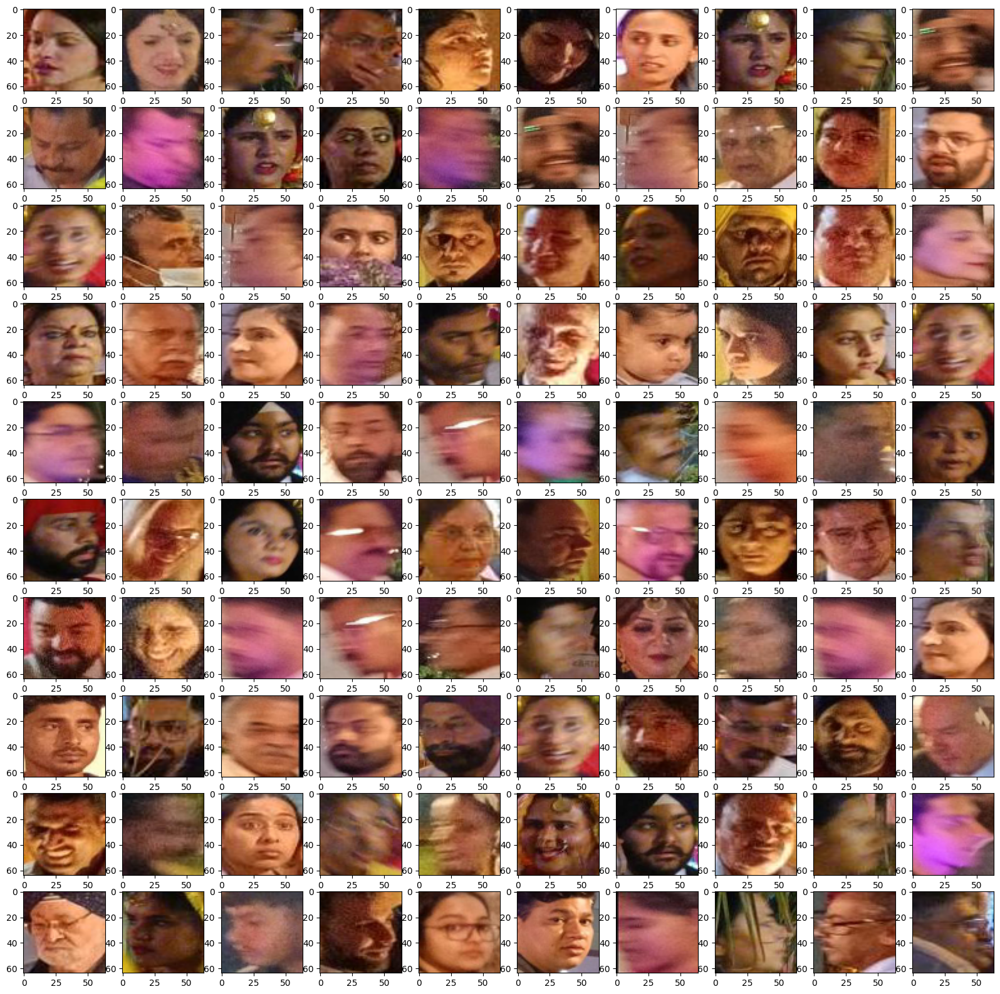

In [ ]:
plt.figure(figsize=(20,20))
for i in range(100):
  plt.subplot(10,10,i+1)
  plt.imshow(xtc[i])

In [ ]:
xtc = np.array(xtc)

In [ ]:
xtc.shape

(100, 64, 64, 3)

In [ ]:
np.save('xtc2.npy',xtc)

In [ ]:
ypc = model.predict(xtc)

4/4 [==============================] - 0s 21ms/step


In [ ]:
np.sum(np.argmax(ypc,axis=1))

72

In [ ]:
from collections import defaultdict

In [ ]:
yp0 = defaultdict(list)
yp1 = defaultdict(list)
for i in range(ypc.shape[0]):
  if np.argmax(ypc[i])==0:
    yp0[ypc[i][0]].append(i)
  else:
    yp1[ypc[i][1]].append(i)

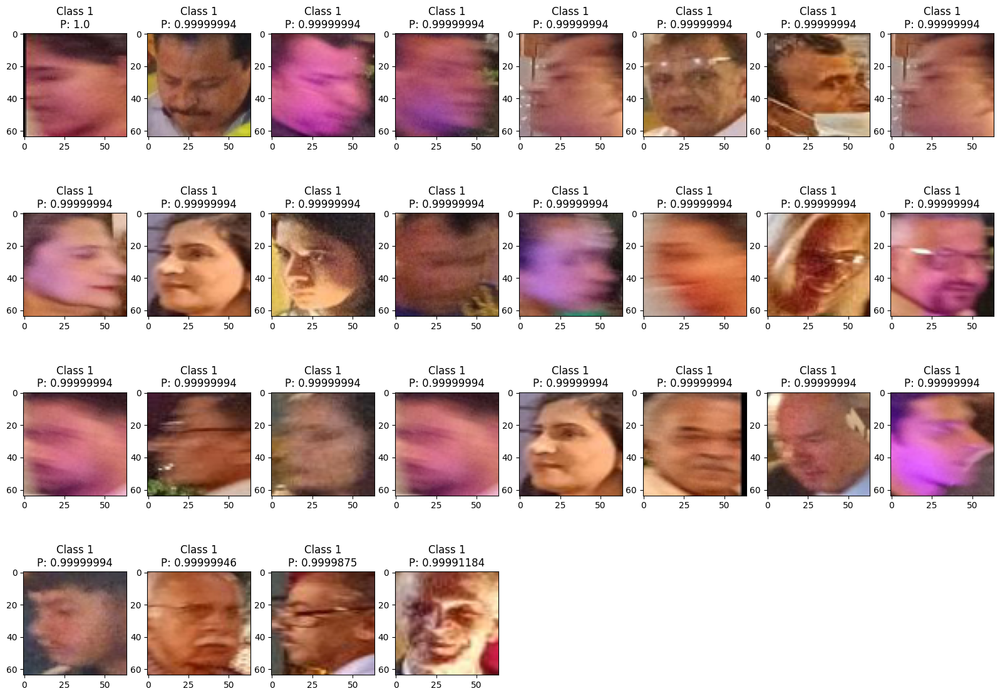

In [ ]:
i=0
plt.figure(figsize=(20,18))
for key in sorted(yp0.keys(), reverse=True):
  for val in yp0[key]:
    plt.subplot(5,8,i+1)
    plt.imshow(xtc[val])
    plt.title("Class 1\nP: "+str(key))
    i+=1
plt.show()

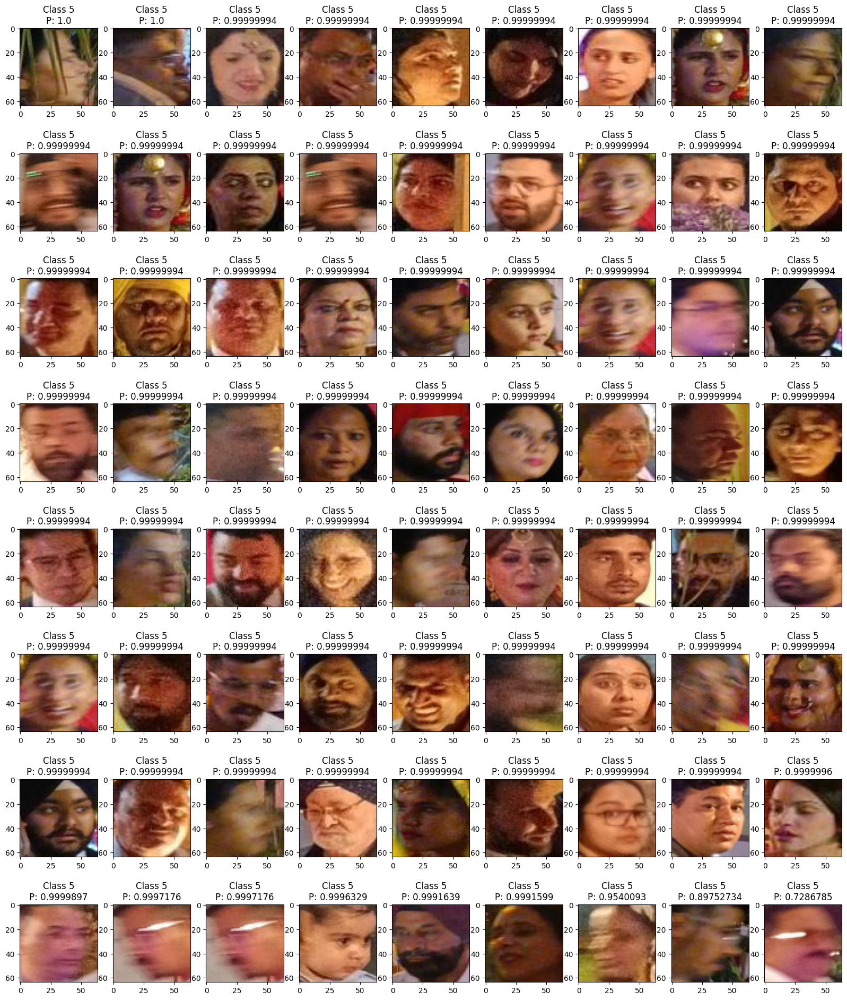

In [ ]:
i=0
plt.figure(figsize=(20,24))
for key in sorted(yp1.keys(), reverse=True):
  for val in yp1[key]:
    plt.subplot(8, 9,i+1)
    plt.imshow(xtc[val])
    plt.title("Class 5\nP: "+str(key))
    i+=1
plt.show()

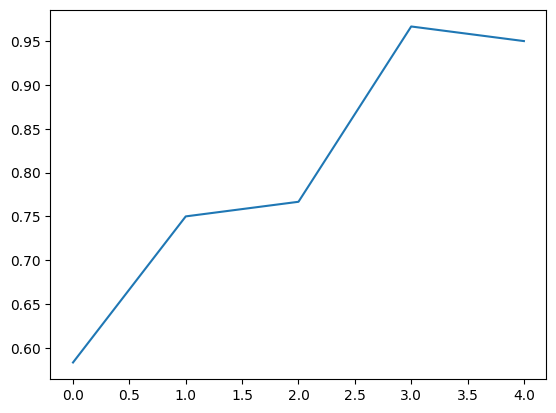

In [ ]:
plt.plot(history.history['accuracy'])

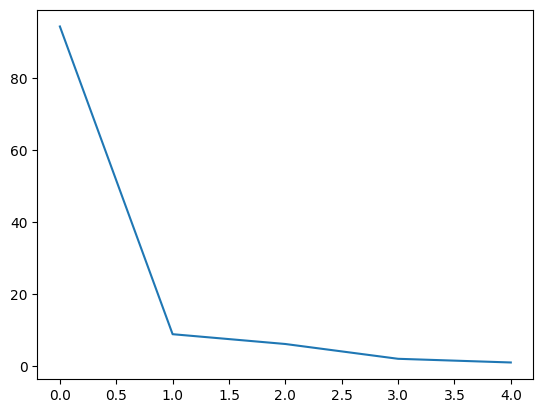

In [ ]:
plt.plot(history.history['loss'])

In [ ]:
pred = np.argmax(pred,axis=1)

In [ ]:
pred

array([3, 3, 3, 3, 2, 3, 3, 3, 2, 3, 3, 3, 3, 3, 2, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 2, 3, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 3,
       3, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3])

In [ ]:
# pred

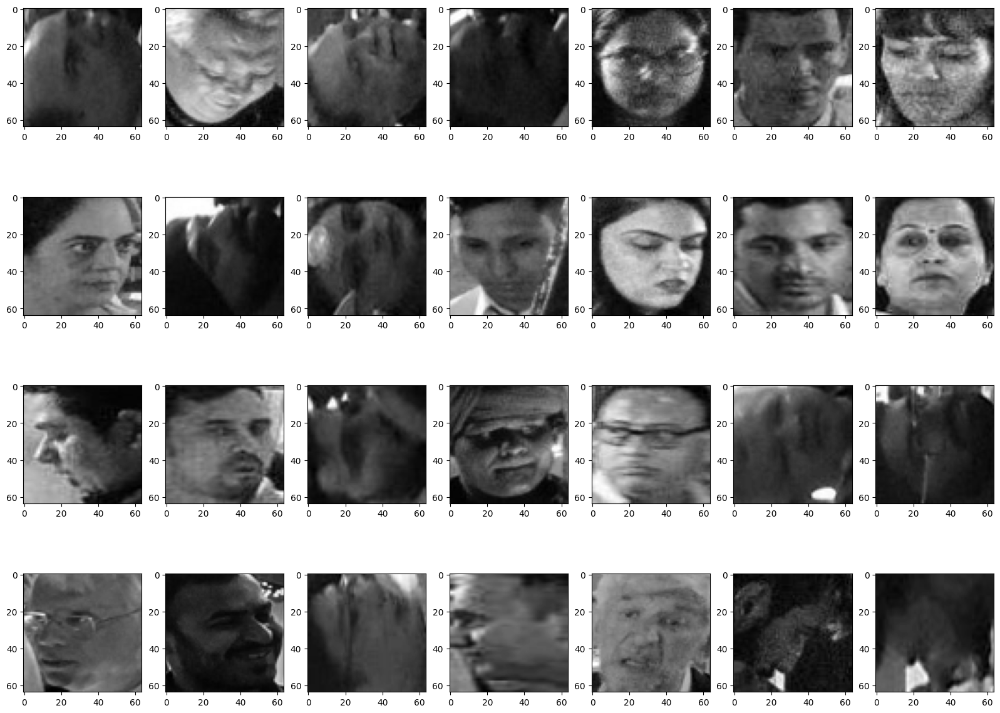

In [ ]:
plt.figure(figsize=(20,15))
for i in range(28):
  plt.subplot(4,7,i+1)
  plt.imshow(x[i], cmap='gray')
  

In [ ]:
history = model.fit(x[:260], y[:260], epochs=20, batch_size=8, validation_data=(x[260:], y[260:]), verbose=1)

Epoch 1/20
33/33 [==============================] - 3s 56ms/step - loss: 2371652096.0000 - accuracy: 0.4269 - val_loss: 1.3236 - val_accuracy: 0.6500
Epoch 2/20
33/33 [==============================] - 1s 30ms/step - loss: 1.2705 - accuracy: 0.4346 - val_loss: 1.1339 - val_accuracy: 0.6500
Epoch 3/20
33/33 [==============================] - 1s 30ms/step - loss: 1.1881 - accuracy: 0.4346 - val_loss: 1.0886 - val_accuracy: 0.6500
Epoch 4/20
33/33 [==============================] - 1s 31ms/step - loss: 1.1641 - accuracy: 0.4308 - val_loss: 1.0856 - val_accuracy: 0.2500
Epoch 5/20
33/33 [==============================] - 1s 30ms/step - loss: 1.1560 - accuracy: 0.4500 - val_loss: 1.0563 - val_accuracy: 0.6500
Epoch 6/20
33/33 [==============================] - 1s 29ms/step - loss: 1.1534 - accuracy: 0.4346 - val_loss: 1.0556 - val_accuracy: 0.6500
Epoch 7/20
33/33 [==============================] - 1s 29ms/step - loss: 1.1523 - accuracy: 0.4346 - val_loss: 1.0467 - val_accuracy: 0.6500
Epoc

(array([ 10.,   0., 126.,   0.,   0., 116.,   0.,  11.,   0.,  17.]),
 array([1. , 1.4, 1.8, 2.2, 2.6, 3. , 3.4, 3.8, 4.2, 4.6, 5. ]),
 <BarContainer object of 10 artists>)

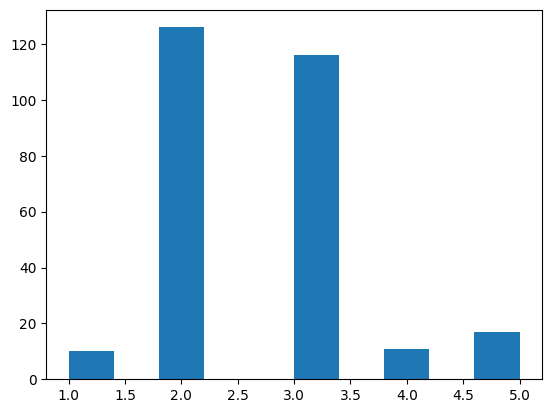

In [ ]:
y = np.load('qual.npy')
plt.hist(y)

In [ ]:
for imagePath in paths.list_images(args["images"]):
	# load the image, convert it to grayscale, and compute the
	# focus measure of the image using the Variance of Laplacian
	# method
	image = cv2.imread(imagePath)
	gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
	fm = variance_of_laplacian(gray)
	text = "Not Blurry"
	# if the focus measure is less than the supplied threshold,
	# then the image should be considered "blurry"
	if fm < args["threshold"]:
		text = "Blurry"
	# show the image
	cv2.putText(image, "{}: {:.2f}".format(text, fm), (10, 30),
		cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 255), 3)
	cv2.imshow("Image", image)
	key = cv2.waitKey(0)

In [ ]:
y = np.load('qual.npy')

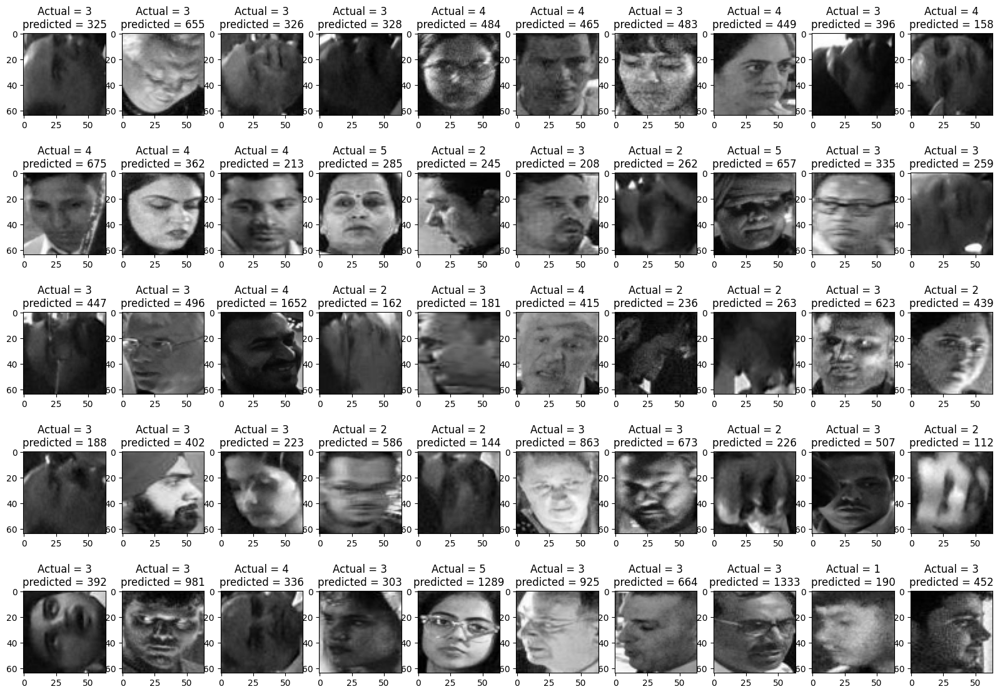

In [ ]:
import cv2
plt.figure(figsize=(20,14))
for i in range(50):
  fm = cv2.Laplacian(x[i], cv2.CV_64F).var()
  plt.subplot(5,10,i+1)
  plt.imshow(x[i], cmap='gray')
  plt.title("Actual = "+str(y[i])+"\npredicted = "+str(int(fm)))
plt.show()

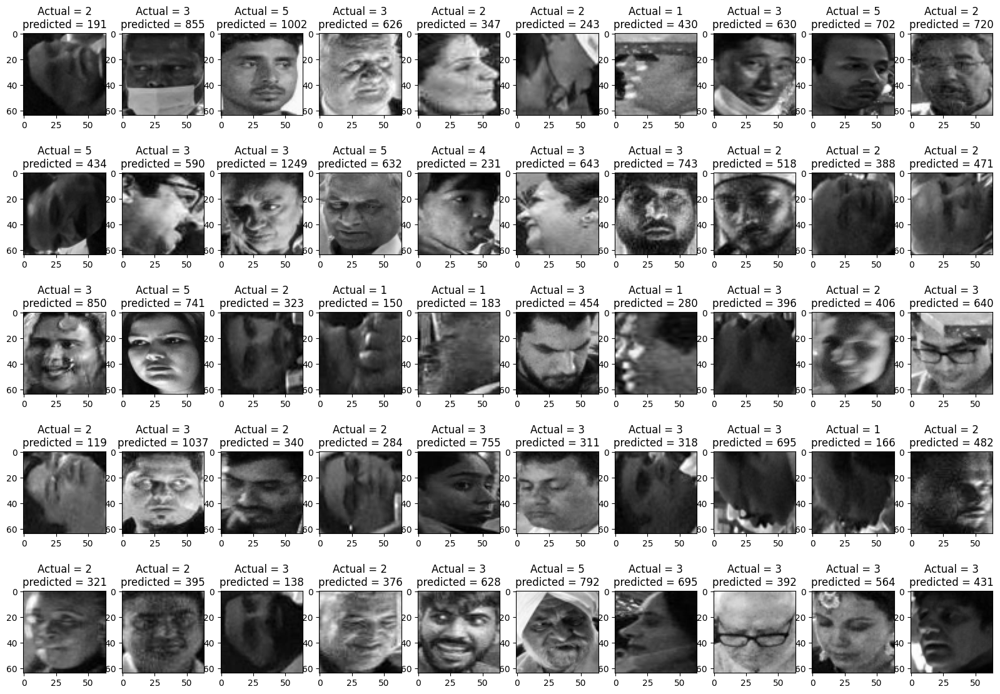

In [ ]:
plt.figure(figsize=(20,14))
for i in range(50):
  fm = cv2.Laplacian(x[50+i], cv2.CV_64F).var()
  plt.subplot(5,10,i+1)
  plt.imshow(x[50+i], cmap='gray')
  plt.title("Actual = "+str(y[50+i])+"\npredicted = "+str(int(fm)))
plt.show()

In [ ]:
plt.figure(figsize=(20,14))
for i in range(50):
  fm = cv2.Laplacian(x[100+i], cv2.CV_64F).var()
  plt.subplot(5,10,i+1)
  plt.imshow(x[100+i], cmap='gray')
  plt.title("Actual = "+str(y[100+i])+"\npredicted = "+str(int(fm)))
plt.show()

In [ ]:
plt.figure(figsize=(20,14))
for i in range(50):
  fm = cv2.Laplacian(x[150+i], cv2.CV_64F).var()
  plt.subplot(5,10,i+1)
  plt.imshow(x[150+i], cmap='gray')
  plt.title("Actual = "+str(y[150+i])+"\npredicted = "+str(int(fm)))
plt.show()

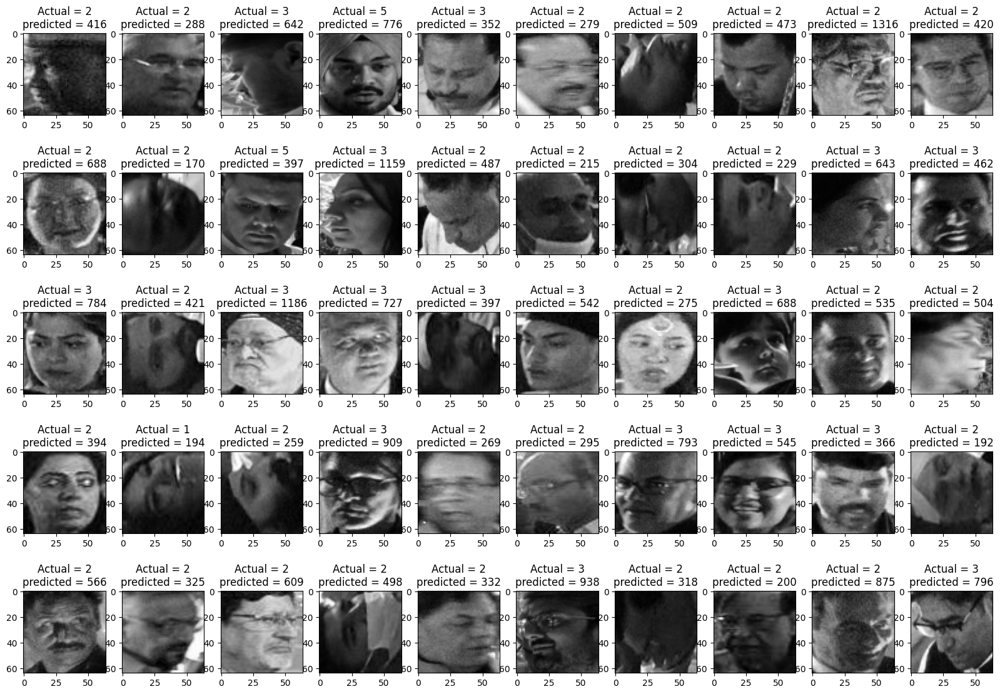

In [ ]:
plt.figure(figsize=(20,14))
for i in range(50):
  fm = cv2.Laplacian(x[200+i], cv2.CV_64F).var()
  plt.subplot(5,10,i+1)
  plt.imshow(x[200+i], cmap='gray')
  plt.title("Actual = "+str(y[200+i])+"\npredicted = "+str(int(fm)))
plt.show()

In [ ]:
plt.figure(figsize=(20,9))
for i in range(30):
  fm = cv2.Laplacian(x[250+i], cv2.CV_64F).var()
  plt.subplot(3,10,i+1)
  plt.imshow(x[250+i], cmap='gray')
  plt.title("Actual = "+str(y[250+i])+"\npredicted = "+str(int(fm)))
plt.show()

# Sorted Order

In [ ]:
from collections import defaultdict
d = defaultdict(list)
for i in range(280):
  fm = cv2.Laplacian(x[i], cv2.CV_64F).var()
  d[fm].append(i)

In [ ]:
ind, val = [], []
for k in sorted(d.keys(), reverse=True):
  for v in d[k]:
    ind.append(v)
    val.append(k)

In [ ]:
for i in sorted(d.keys(), reverse=True):
  print(i,d[i])

In [ ]:
plt.figure(figsize=(20,14))
for i in range(50):
  plt.subplot(5,10,i+1)
  i+=0
  plt.imshow(x[ind[i]], cmap='gray')
  plt.title("Actual = "+str(y[ind[i]])+"\npredicted = "+str(int(val[i])))
plt.show()

In [ ]:
plt.figure(figsize=(20,14))
for i in range(50):
  plt.subplot(5,10,i+1)
  i+=50
  plt.imshow(x[ind[i]], cmap='gray')
  plt.title("Actual = "+str(y[ind[i]])+"\npredicted = "+str(int(val[i])))
plt.show()

In [ ]:
plt.figure(figsize=(20,14))
for i in range(50):
  plt.subplot(5,10,i+1)
  i+=100
  plt.imshow(x[ind[i]], cmap='gray')
  plt.title("Actual = "+str(y[ind[i]])+"\npredicted = "+str(int(val[i])))
plt.show()

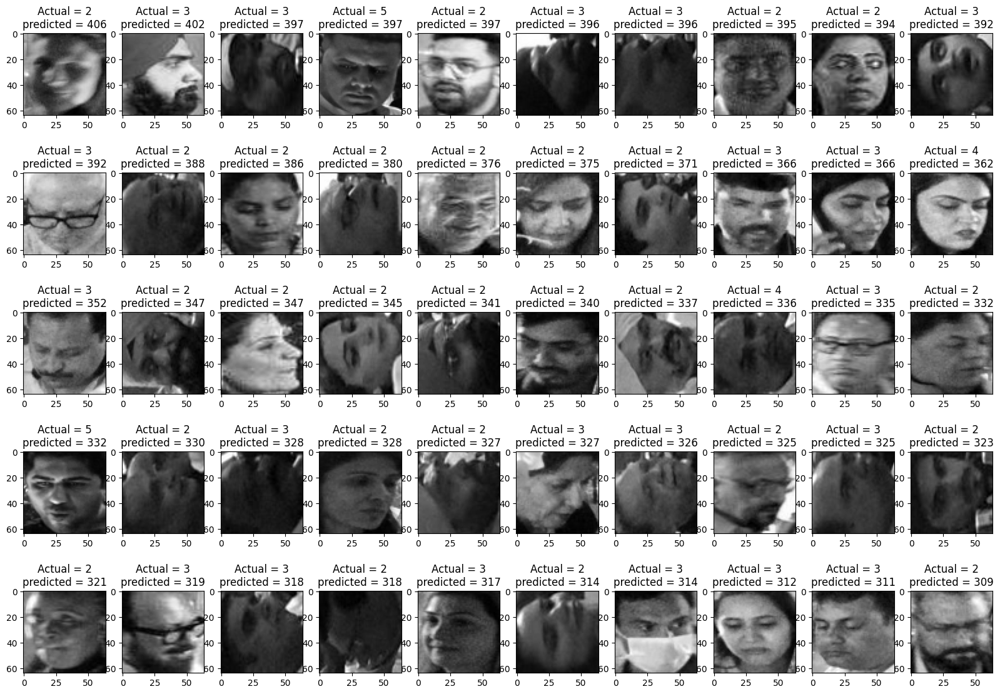

In [ ]:
plt.figure(figsize=(20,14))
for i in range(50):
  plt.subplot(5,10,i+1)
  i+=150
  plt.imshow(x[ind[i]], cmap='gray')
  plt.title("Actual = "+str(y[ind[i]])+"\npredicted = "+str(int(val[i])))
plt.show()

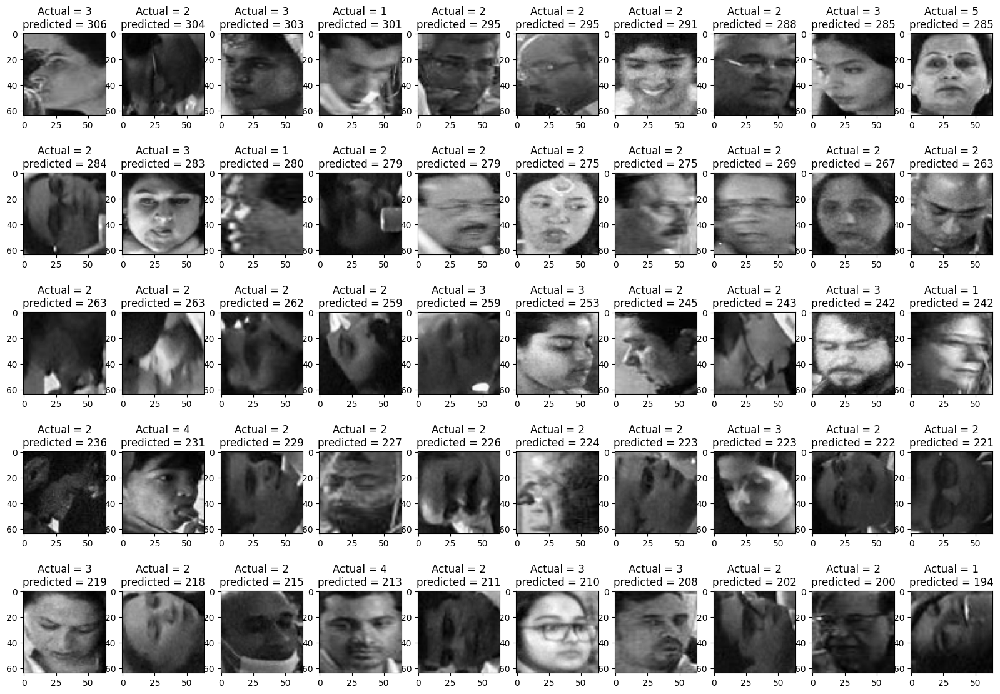

In [ ]:
plt.figure(figsize=(20,14))
for i in range(50):
  plt.subplot(5,10,i+1)
  i+=200
  plt.imshow(x[ind[i]], cmap='gray')
  plt.title("Actual = "+str(y[ind[i]])+"\npredicted = "+str(int(val[i])))
plt.show()

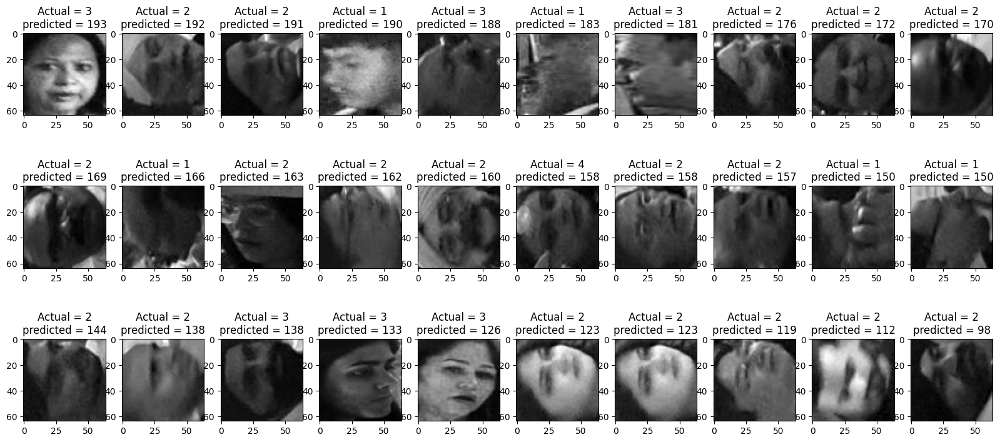

In [ ]:
plt.figure(figsize=(20,9))
for i in range(30):
  plt.subplot(3,10,i+1)
  i+=250
  plt.imshow(x[ind[i]], cmap='gray')
  plt.title("Actual = "+str(y[ind[i]])+"\npredicted = "+str(int(val[i])))
plt.show()

In [ ]:
x1,x2,x3,x4,x5 = [],[],[],[],[]
for i in range(280):
  if y[i]==1:
    x1.append(x[i])
  elif y[i]==2:
    x2.append(x[i])
  elif y[i]==3:
    x3.append(x[i])
  elif y[i]==4:
    x4.append(x[i])
  elif y[i]==5:
    x5.append(x[i])

In [ ]:
import numpy as np
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import cv2
from PIL import Image, ImageOps
import glob
x1 = []
path = "/content/drive/My Drive/Test/*"
for file in glob.glob(path):
   a = Image.open(file)
   a = ImageOps.grayscale(a)
   a = a.resize((64,64))
   a = np.array(a)
   x1.append(a)

In [ ]:
x1 = np.array(x1)
x1.shape

(100, 64, 64)

In [ ]:
np.save('test_gray.npy',x1)

In [ ]:
for i in [1,3,6,11,14,16,22,24,25,29,30]:
  x1[i] = np.rot90(x1[i], 3)

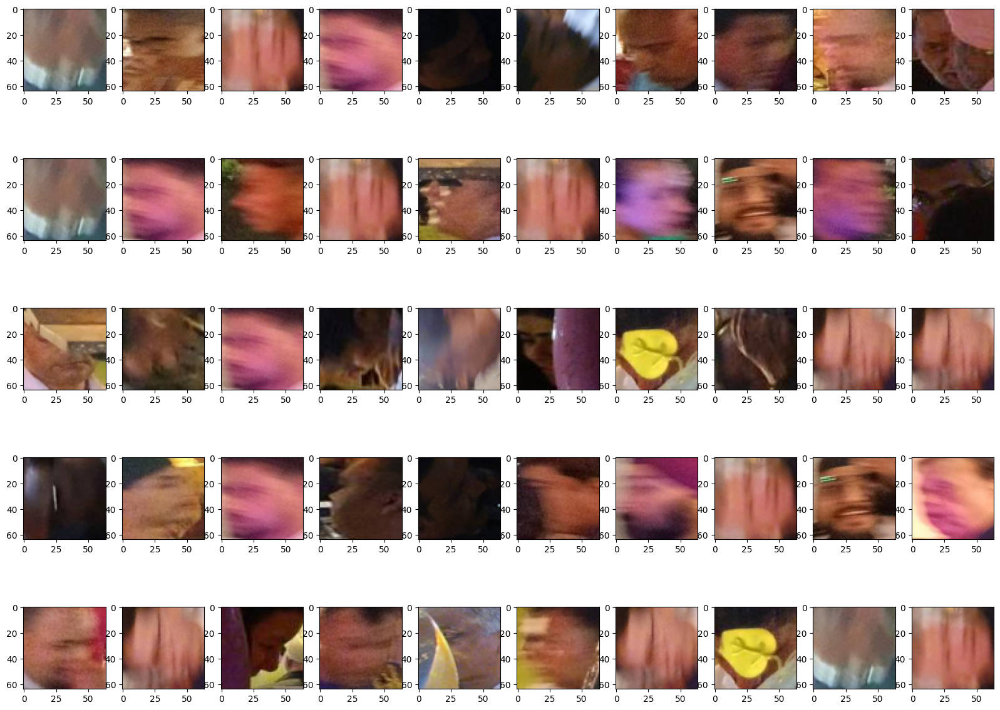

In [ ]:
plt.figure(figsize=(20,15))
for i in range(1,51):
  plt.subplot(5,10,i)
  plt.imshow(x1[i])

In [ ]:
x = []
for i in x1:
  x.append(np.array(i))
x1 = x

In [ ]:
x1 = np.array(x1)

In [ ]:
x1.shape

(51, 64, 64)

In [ ]:
np.save('x1.npy', x1)

In [ ]:
x2 = []
path = "/content/drive/My Drive/imgs/5/*"
for file in glob.glob(path):
   a = Image.open(file)
   a = ImageOps.grayscale(a)
   a = a.resize((64,64))
   x2.append(a)

In [ ]:
for i in [9,13,25,29,32,33,34,41,43,54]:
  x2[i] = np.rot90(x2[i], 3)

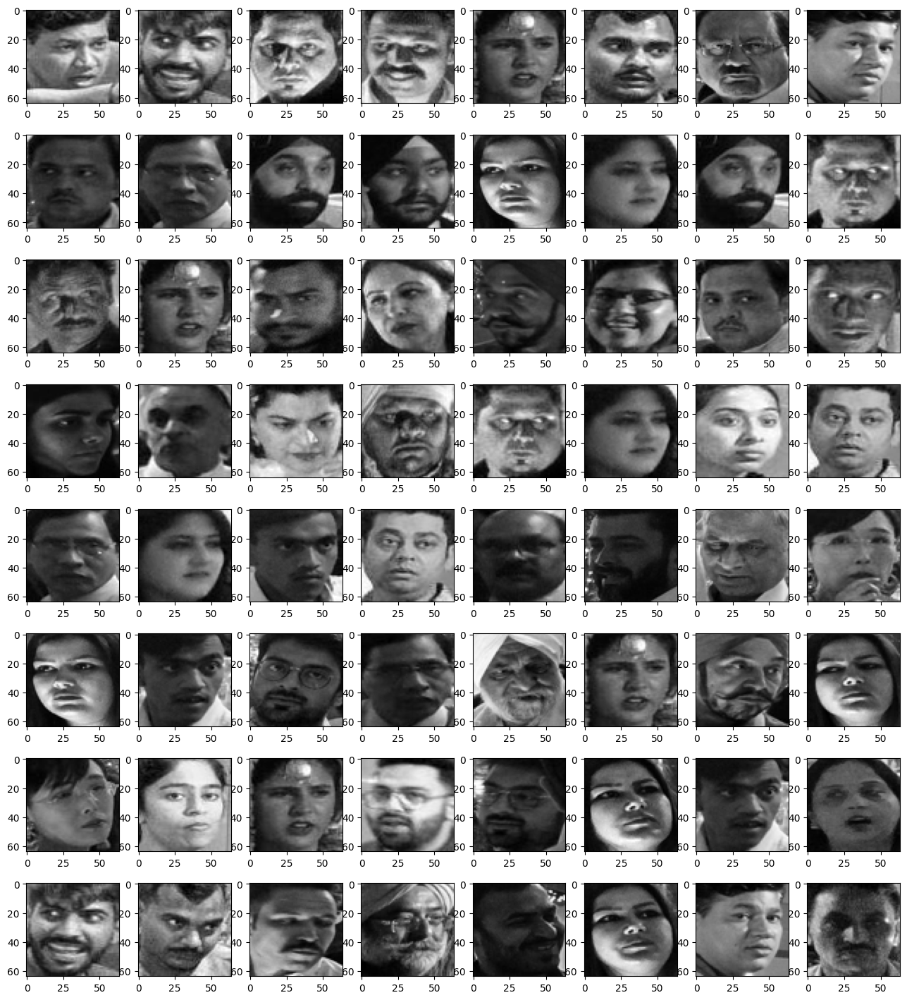

In [ ]:
plt.figure(figsize=(16,18))
for i in range(64):
  plt.subplot(8,8,i+1)
  plt.imshow(x2[i], cmap='gray')

In [ ]:
x = []
for i in x2:
  x.append(np.array(i))
x2 = x

In [ ]:
x2 = np.array(x2)

In [ ]:
x2.shape

(64, 64, 64)

In [ ]:
np.save('x5.npy',x2)

In [ ]:
x5 = np.load('Xc_train.npy')

In [ ]:
x1 = x1
x5 = x2

In [ ]:
xnew = np.concatenate((x1[:50],x5[:50]), axis=0)

In [ ]:
ynew = np.array([0]*50+[1]*50)

In [ ]:
xnew, ynew = shuffle(xnew, ynew, random_state=0)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(xnew, ynew, test_size=0.2, random_state=1)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1)

In [ ]:
X_train.shape, X_val.shape, X_test.shape, y_train.shape, y_val.shape, y_test.shape

((60, 64, 64), (20, 64, 64), (20, 64, 64), (60,), (20,), (20,))

In [ ]:
y_train = y_train.reshape(-1,1)
y_test = y_test.reshape(-1,1)
y_val = y_val.reshape(-1,1)

In [ ]:
np.save('X_train.npy', X_train)
np.save('X_test.npy', X_test)
np.save('X_val.npy', X_val)
np.save('y_train.npy', y_train)
np.save('y_test.npy', y_test)
np.save('y_val.npy', y_val)

Trying Laplacian + Logistic regression

In [ ]:
import zipfile

zip_ref = zipfile.ZipFile("/content/numpy_data.zip", 'r')
zip_ref.extractall()
zip_ref.close()

In [ ]:
X_test = np.load('/content/numpy_data/X_test.npy')
X_train = np.load('/content/numpy_data/X_train.npy')
X_val = np.load('/content/numpy_data/X_val.npy')
y_test = np.load('/content/numpy_data/y_test.npy')
y_train = np.load('/content/numpy_data/y_train.npy')
y_val = np.load('/content/numpy_data/y_val.npy')

In [ ]:
X_train.shape, X_test.shape, X_val.shape, y_train.shape, y_test.shape, y_val.shape

((60, 64, 64), (20, 64, 64), (20, 64, 64), (60, 1), (20, 1), (20, 1))

In [ ]:
laplaces = []
for i in range(len(X_train)):
  fm = cv2.Laplacian(X_train[i], cv2.CV_64F).var()
  laplaces.append(int(fm))
print(laplaces)
# fm = cv2.Laplacian(x[100+i], cv2.CV_64F).var()

[457, 77, 424, 192, 628, 360, 104, 591, 203, 565, 708, 143, 269, 546, 1036, 57, 192, 566, 301, 528, 163, 116, 591, 256, 957, 151, 461, 407, 677, 823, 72, 568, 792, 57, 114, 823, 1154, 250, 57, 546, 270, 116, 632, 319, 254, 266, 545, 300, 19, 741, 57, 521, 116, 430, 151, 264, 121, 121, 116, 478]


In [ ]:
laplaces = np.array(laplaces)

laplaces = laplaces.reshape(-1, 1)
laplaces.shape

(60, 1)

In [ ]:
for i in range(len(laplaces)):
  print(laplaces[i], y_train[i][0])

In [ ]:
print(laplaces.shape)
print(y_train.shape)

(60, 1)
(60, 1)


In [ ]:
# X => laplaces
# Y => y_train
from sklearn.linear_model import LogisticRegression

clf = LogisticRegression().fit(laplaces, y_train)

/usr/local/lib/python3.9/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
def convert_nparray_to_laplaces(X):
  laplaces = []
  for i in range(len(X)):
    fm = cv2.Laplacian(X[i], cv2.CV_64F).var()
    laplaces.append(int(fm))

  laplaces = np.array(laplaces)
  laplaces = laplaces.reshape(-1, 1)
  return laplaces

In [ ]:
pred_val = clf.predict(convert_nparray_to_laplaces(X_val))
test_val = clf.predict(convert_nparray_to_laplaces(X_test))
pred_val

array([0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1])

In [ ]:
from sklearn import metrics
confusion_matrix = metrics.confusion_matrix(y_val, pred_val)
confusion_matrix

array([[ 5,  1],
       [ 3, 11]])

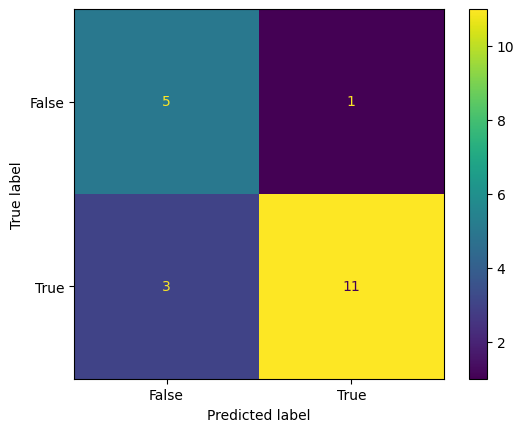

In [ ]:
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])

cm_display.plot()
plt.show()

In [ ]:
accuracy = (confusion_matrix[0][0] + confusion_matrix[1][1]) / (confusion_matrix[0][1] + confusion_matrix[1][0] + confusion_matrix[0][0] + confusion_matrix[1][1])
accuracy * 100

80.0

In [ ]:
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(y_val, pred_val)
accuracy * 100

80.0

In [ ]:
from sklearn.metrics import f1_score

f1_score = f1_score(y_val, pred_val, average='weighted')
f1_score

0.8065934065934066

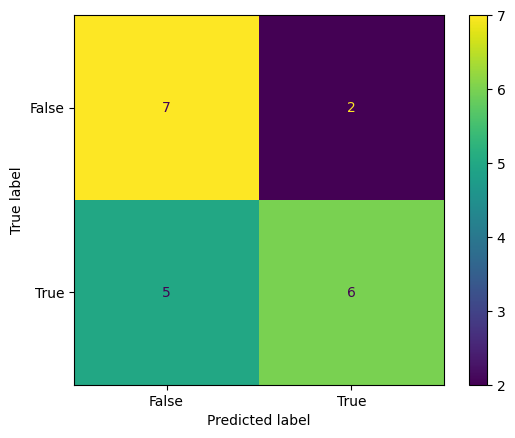

In [ ]:
pred_test = clf.predict(convert_nparray_to_laplaces(X_test))

confusion_matrix = metrics.confusion_matrix(y_test, pred_test)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])

cm_display.plot()
plt.show()

In [ ]:
accuracy = accuracy_score(y_test, pred_test)
print(accuracy)

0.65


In [ ]:
accuracy = accuracy_score(y_test, pred_test)
print(accuracy)

from sklearn.metrics import f1_score
f1_score = f1_score(y_test, pred_test, average='weighted')
print(f1_score)

0.6473684210526315


PCA + SVM

In [ ]:
nsamples, nx, ny = X_train.shape
X_train_ds = X_train.reshape((nsamples,nx*ny))

X_train_ds.shape

(60, 4096)

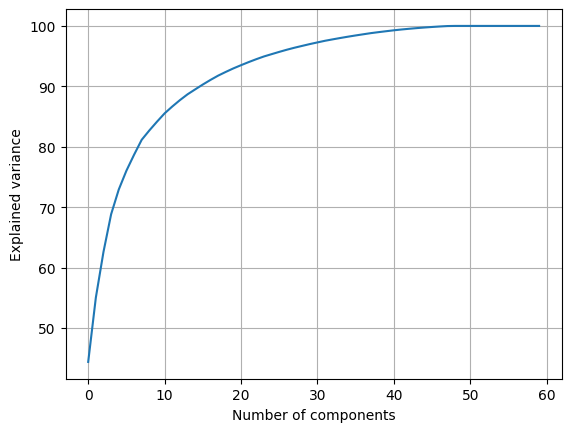

In [ ]:
import numpy as np
from sklearn.decomposition import PCA

pca_784 = PCA(n_components=60)
pca_784.fit(X_train_ds)

plt.grid()
plt.plot(np.cumsum(pca_784.explained_variance_ratio_ * 100))
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
plt.savefig('Scree plot.png')

In [ ]:
X_train.shape

(60, 64, 64)

In [ ]:
X_train.shape

(60, 64, 64)

In [ ]:
# X_train, X_test, X_val
# y_train, y_test, y_val

from sklearn.decomposition import PCA
pca = PCA(n_components = 8)
pca.fit(X_train_ds) # training
X_pca = pca.transform(X_train_ds)

In [ ]:
X_pca.shape

(60, 8)

In [ ]:
X_pca.shape, y_train.shape

((60, 8), (60, 1))

In [ ]:
from sklearn.svm import SVC # "Support vector classifier"  
classifier = SVC(kernel='rbf')  
classifier.fit(X_pca, y_train)

/usr/local/lib/python3.9/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SVC()

In [ ]:
nsamples, nx, ny = X_val.shape
X_val_ds = X_val.reshape((nsamples,nx*ny))
val_pca = pca.transform(X_val_ds)

In [ ]:
val_pca.shape

(20, 8)

In [ ]:
val_pred = classifier.predict(val_pca)
val_pred

array([1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0])

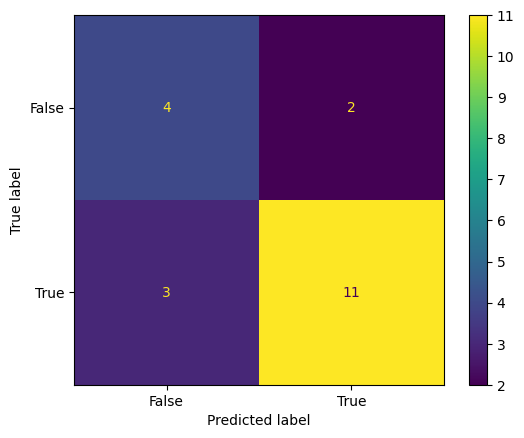

In [ ]:
from sklearn import metrics
confusion_matrix = metrics.confusion_matrix(y_val, val_pred)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])

cm_display.plot()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
accuracy = accuracy_score(y_val, val_pred)
print(accuracy*100)

from sklearn.metrics import f1_score
f1_score = f1_score(y_val, val_pred, average='weighted')
print(f1_score*100)

75.0
75.49857549857549


In [ ]:
nsamples, nx, ny = X_test.shape
X_test_ds = X_test.reshape((nsamples,nx*ny))
test_pca = pca.transform(X_test_ds)

In [ ]:
# for i in range(1, 60):
#   pca = PCA(n_components = i)
#   pca.fit(X_train_ds) # training
#   X_pca = pca.transform(X_train_ds)

#   classifier = SVC(kernel='rbf')  
#   classifier.fit(X_pca, y_train)

#   nsamples, nx, ny = X_val.shape
#   X_val_ds = X_val.reshape((nsamples,nx*ny))
#   val_pca = pca.transform(X_val_ds)

#   val_pred = classifier.predict(val_pca)

#   accuracy = accuracy_score(y_val, val_pred)
#   from sklearn.metrics import f1_score
#   f1_score = f1_score(y_val, val_pred, average='weighted')
#   print("Val: " + str(i) + ": accuracy: " + str(accuracy*100) + ", f1 score: " + str(f1_score*100))

#   nsamples, nx, ny = X_test.shape
#   X_test_ds = X_test.reshape((nsamples,nx*ny))
#   test_pca = pca.transform(X_test_ds)

#   test_pred = classifier.predict(test_pca)
#   accuracy = accuracy_score(y_test, test_pred)
#   from sklearn.metrics import f1_score
#   f1_score = f1_score(y_test, test_pred, average='weighted')
#   print("Test: " + str(i) + ": accuracy: " + str(accuracy*100) + ", f1 score: " + str(f1_score*100))

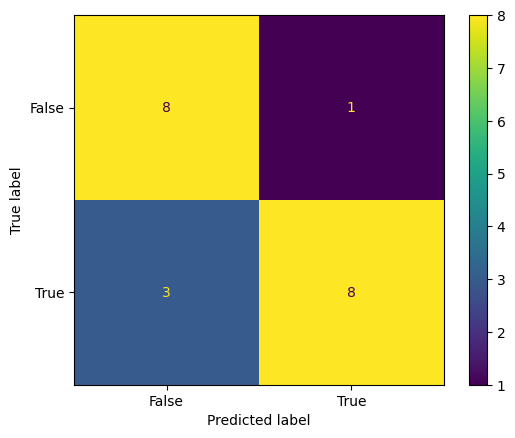

In [ ]:
test_pred = classifier.predict(test_pca)

from sklearn import metrics
confusion_matrix = metrics.confusion_matrix(y_test, test_pred)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])

cm_display.plot()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
accuracy = accuracy_score(y_test, test_pred)
print(accuracy*100)

from sklearn.metrics import f1_score
f1_score = f1_score(y_test, test_pred, average='weighted')
print(f1_score*100)

80.0
80.0


In [ ]:
from sklearn.svm import SVC # "Support vector classifier"  
classifier = SVC(kernel='sigmoid')  
classifier.fit(X_pca, y_train)

/usr/local/lib/python3.9/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SVC(kernel='sigmoid')

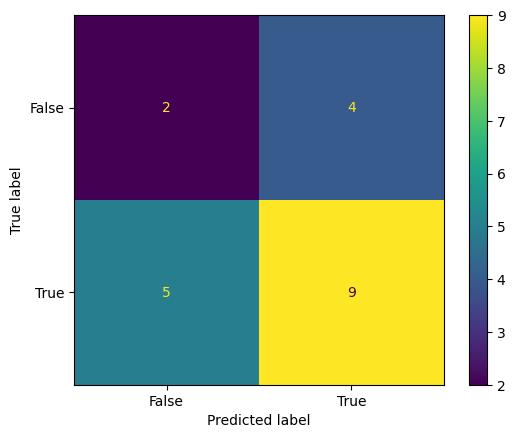

55.00000000000001
55.8974358974359


In [ ]:
nsamples, nx, ny = X_val.shape
X_val_ds = X_val.reshape((nsamples,nx*ny))
val_pca = pca.transform(X_val_ds)

val_pred = classifier.predict(val_pca)

from sklearn import metrics
confusion_matrix = metrics.confusion_matrix(y_val, val_pred)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])

cm_display.plot()
plt.show()

from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
accuracy = accuracy_score(y_val, val_pred)
print(accuracy*100)

from sklearn.metrics import f1_score
f1_score = f1_score(y_val, val_pred, average='weighted')
print(f1_score*100)

Resnet 18

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications.resnet import ResNet101

pre_trained_model = ResNet101(input_shape=(64, 64, 3), include_top=False, weights='imagenet')

In [ ]:
for layer in pre_trained_model.layers:
  layer.trainable = False

In [ ]:
last_layer = pre_trained_model.get_layer('conv4_block23_2_conv')
print ('Last layer output shape: ' + str(last_layer.output_shape))
last_output = last_layer.output

Last layer output shape: (None, 4, 4, 256)


In [ ]:
from tensorflow.keras.optimizers import Adam

x = tf.keras.layers.Flatten()(last_output)
x = tf.keras.layers.Dense(1024)(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.Dropout(0.25)(x)
x = tf.keras.layers.Dense(512)(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.Dropout(0.25)(x)
x = tf.keras.layers.Dense(64)(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.Dropout(0.25)(x)
x = tf.keras.layers.Dense(2, activation='softmax')(x)

model = tf.keras.Model(pre_trained_model.input, x)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
model.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 64, 64, 3)]  0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 70, 70, 3)    0           ['input_5[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 32, 32, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 32, 32, 64)   256         ['conv1_conv[0][0]']             
                                                                                            

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_dir = '/content/dataset/'
# validation_dir = '/content/Indian currency dataset v1/validation/'

train_datagen = ImageDataGenerator(
    rescale = 1. / 255,
    # rotation_range = 40,
    width_shift_range = 0.2,
    height_shift_range = 0.2,
    shear_range = 0.15,
    zoom_range = 0.3,
    # horizontal_flip = True,
    fill_mode = 'nearest'
)

# validation_datagen = ImageDataGenerator(
#     rescale = 1. / 255,
# )

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size = (64, 64),
    batch_size=8,
    class_mode = 'categorical'
)

# validation_generator = validation_datagen.flow_from_directory(
#     validation_dir,
#     target_size = (150, 150),
#     class_mode = 'categorical'
# )

Found 115 images belonging to 2 classes.


In [ ]:
tf.config.run_functions_eagerly(True)
history = model.fit_generator(
    train_generator,
    epochs = 10,
    verbose=1
)

Epoch 1/10


<ipython-input-151-b79a5d772797>:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(
/usr/local/lib/python3.9/dist-packages/tensorflow/python/data/ops/structured_function.py:254: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


15/15 [==============================] - 20s 1s/step - loss: 0.5994 - accuracy: 0.7217
Epoch 2/10
15/15 [==============================] - 21s 1s/step - loss: 0.5772 - accuracy: 0.7304
Epoch 3/10
15/15 [==============================] - 21s 1s/step - loss: 0.6951 - accuracy: 0.6957
Epoch 4/10
15/15 [==============================] - 20s 1s/step - loss: 0.5981 - accuracy: 0.7130
Epoch 5/10
15/15 [==============================] - 22s 1s/step - loss: 0.5350 - accuracy: 0.7304
Epoch 6/10
15/15 [==============================] - 21s 1s/step - loss: 0.5671 - accuracy: 0.7826
Epoch 7/10
15/15 [==============================] - 20s 1s/step - loss: 0.5526 - accuracy: 0.7043
Epoch 8/10
15/15 [==============================] - 21s 1s/step - loss: 0.5209 - accuracy: 0.7652
Epoch 9/10
15/15 [==============================] - 21s 1s/step - loss: 0.4946 - accuracy: 0.8000
Epoch 10/10
15/15 [==============================] - 21s 1s/step - loss: 0.6628 - accuracy: 0.7217


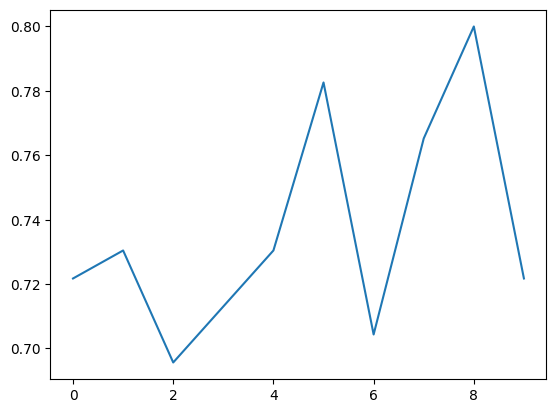

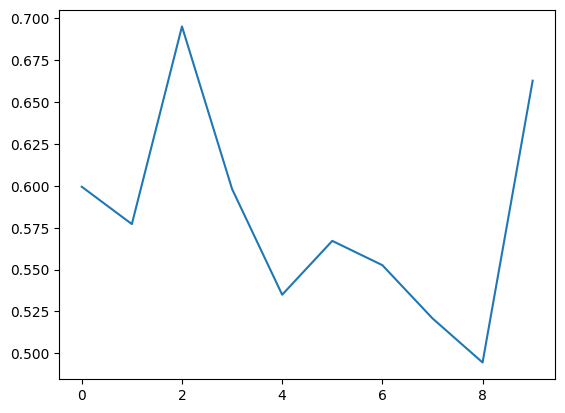

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['accuracy'])
plt.show()

plt.plot(history.history['loss'])
plt.show()